### LoopFlopy Example 3 - Adding Heterogeneity  

This notebook creates the "truth"

In [1]:
%load_ext autoreload
%autoreload 2

import loopflopy
import loopflopy.utils as utils

print(loopflopy.__file__)
modules = utils.list_modules(loopflopy)
for module in modules: print(module)

C:\Users\00105295\Projects\loopflopy\src\loopflopy\__init__.py
dem
disv2disu
flowmodel
flowmodel_routines
geomodel
geomodel2
geomodel_routines
mesh
mesh_routines
observations
project
properties
properties2
spatial
spatial_routines
structuralmodel
surfacerefinement
utils


### 1. Setup Project

In [2]:
# Project setup
name = 'example'
workspace = '../modelfiles/'
results = '../results/'
figures = '../figures/'
triexe = '../exe/triangle.exe'
mfexe_name = '../exe/mf6.exe'

from loopflopy.project import Project
project = Project(name, workspace, results, figures, triexe, mfexe_name)

### 2. Spatial

In [15]:
from loopflopy.spatial import Spatial
spatial = Spatial(epsg = 28350) # UTM zone 50S, EPSG:28350

from preproc.spatial import *
make_bbox_shp(spatial, x0 = 348000, x1 = 390000, y0 = 6503000, y1 = 6520000) # x1 = 415000
make_model_boundary(spatial, boundary_buff = 500, simplify_tolerance = 800, node_spacing = 1000)
make_obs_bores(spatial)
make_geo_bores(spatial)
make_pump_bores(spatial)
make_head_boundary(spatial)
make_faults(spatial)
make_lakes(spatial)
make_xsections(spatial, xlsx_fname = "../data/example_data.xlsx", sheet_name = "xsections")
make_pilot_points(spatial)

c:\Users\00105295\Projects\loopflopy\examples\Example 3 - Heterogeneity\scripts\preproc\spatial.py:266: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf.plot(ax=ax, markersize = 12, color = 'purple', zorder=2)


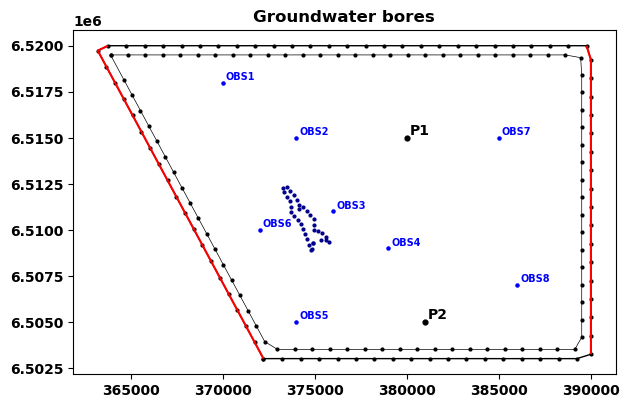

In [16]:
from preproc.spatial import plot_spatial_inputs
plot_spatial_inputs(spatial, obsbores = True, controlpoints = True, pumpbores = True, title = 'Groundwater bores')

c:\Users\00105295\Projects\loopflopy\examples\Example 3 - Heterogeneity\scripts\preproc\spatial.py:260: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf.plot(ax=ax, markersize = 12, color = 'green', zorder=2)
c:\Users\00105295\Projects\loopflopy\examples\Example 3 - Heterogeneity\scripts\preproc\spatial.py:272: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf.plot(ax=ax, markersize = 12, color = 'black', zorder=2)


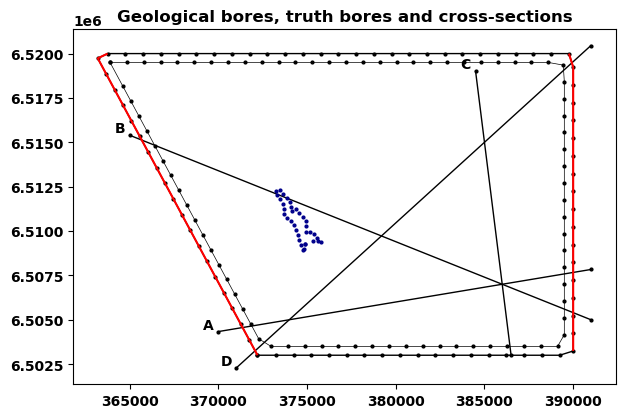

In [17]:
plot_spatial_inputs(spatial, 
                    geobores = True, 
                    xsections = True, 
                    truthpoints = True,
                    title = 'Geological bores, truth bores and cross-sections')

In [18]:
# Create a map
m = spatial.obsbore_gdf.explore(location=[-31.4, 115.8], zoom_start=10, popup = 'ID')
spatial.model_boundary_gdf.explore(m=m, fill = False)
#spatial.faults_gdf.explore(m=m, color = 'red')
spatial.pumpbore_gdf.explore(m=m, color = 'red', popup = 'ID')

AssertionError: The field ID is not available in the data. Choose from: ('id', 'x', 'y', 'zobs', 'kh').

### 2. Topography

In [19]:
from loopflopy.dem import DEM

# Crops large DEM to structural model bounding box
uncropped_dem = DEM(geotiff_fname = "../data/dem/Hydro_Enforced_1_Second_DEM.tif")
uncropped_dem.crop_raster(bbox_path = "../data/shp/bbox.shp", cropped_raster_path = "../data/dem/cropped_raster.tif")

EPSG:28350
EPSG:28350


### 3. Structural Model

In [20]:
# A bounding box for structural model
x0, x1 = 348000, 400000
y0, y1 = 6500000, 6550000
z0, z1 = -1000, 500
bbox = [(x0, y0, z0), (x1, y1, z1)]

from loopflopy.spatial_routines import make_bbox_shp
crop_polygon = make_bbox_shp(x0, x1, y0, y1, crs=spatial.crs, fname = '../data/shp/structuralmodel.shp')
geodata_fname, data_sheetname, strat_sheetname = '../data/example_data.xlsx', 'geo_bores', 'strat'

from loopflopy.structuralmodel import StructuralModel
structuralmodel = StructuralModel(bbox, geodata_fname, data_sheetname, strat_sheetname)

from preproc.structural import prepare_strat_column, prepare_geodata, create_structuralmodel
prepare_strat_column(structuralmodel)

['Ground', 'TQ', 'Kcok', 'Kwlp', 'Kwlw', 'Kwlm']
['Ground', 'TQ', 'Kcok', 'Leed1', 'Leed2']


In [21]:
df = pd.read_excel(structuralmodel.geodata_fname, sheet_name=structuralmodel.data_sheetname)
prepare_geodata(structuralmodel, spatial, dem_tif = "../data/dem/cropped_raster.tif", 
                control = False, truth = True, Fault = False)
create_structuralmodel(structuralmodel, nelements = 1e4, Fault = False)
#structuralmodel.data



1.6.14


c:\Users\00105295\AppData\Local\anaconda3\envs\loopflopy\Lib\site-packages\LoopStructural\modelling\core\geological_model.py:646: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap, n_units)


In [22]:
from loopflopy.mesh_routines import create_structured_mesh
m = create_structured_mesh(bbox, ncol=100, nrow=100, crs=spatial.crs)
structuralmodel.make_surfaces(m)

No special cells
     
Creating surface for feature: Ground, lithid -1, value: 60
number of vertices =  2558
     
Creating surface for feature: TQ, lithid 0, value: 5
number of vertices =  2724
     
Creating surface for feature: Kcok, lithid 1, value: -174
number of vertices =  2016
     
Creating surface for feature: Leed1, lithid 2, value: -184
number of vertices =  3025
     
Creating surface for feature: Leed2, lithid 3, value: -569
number of vertices =  3749


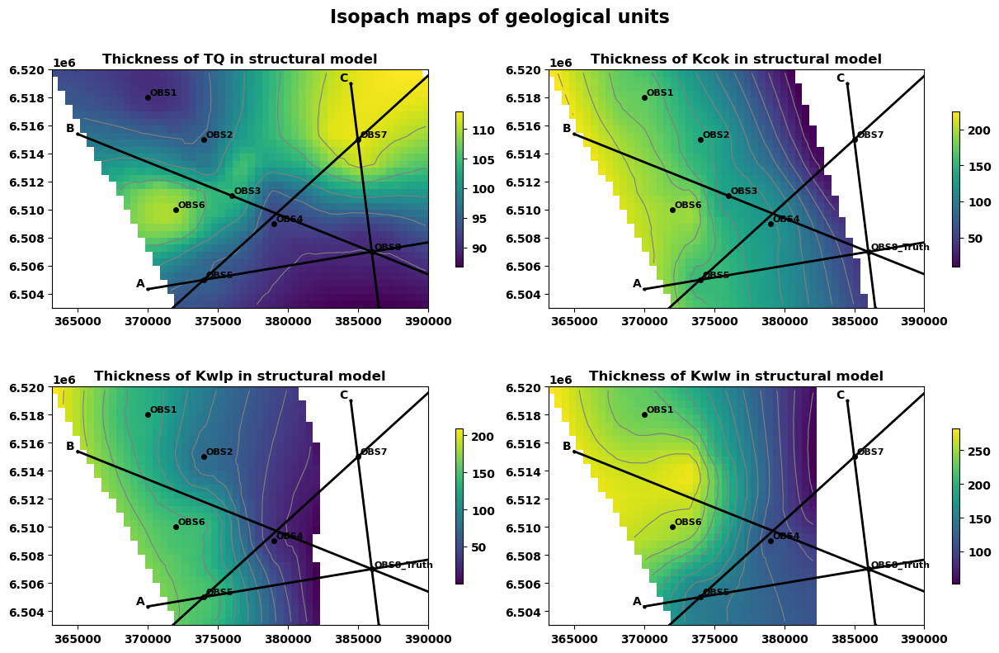

In [25]:
from preproc.truth import plot_isopachs

dz = [5., 20., 20., 20., 20.] # Contour intervals for each unit
vmin_lay = [90., 10., 0., 0.] # Use same max value for colorbar to compare methods
vmax_lay = [115., 250., 200., 300.] # Use same max value for colorbar to compare methods
figsize = (12,8)

plot_isopachs(mesh = m, 
            structuralmodel = structuralmodel,
            shapely_boundary = spatial.model_boundary_poly, 
            figsize = figsize,
            title = 'Isopach maps of geological units',
            #vmin = vmin_lay[i],
            #vmax = vmax_lay[i],
            xlim = [spatial.x0, spatial.x1],
            ylim = [spatial.y0, spatial.y1],
            dz = dz,
            xsections = spatial.xsections,
            xsection_names = spatial.xsection_names)

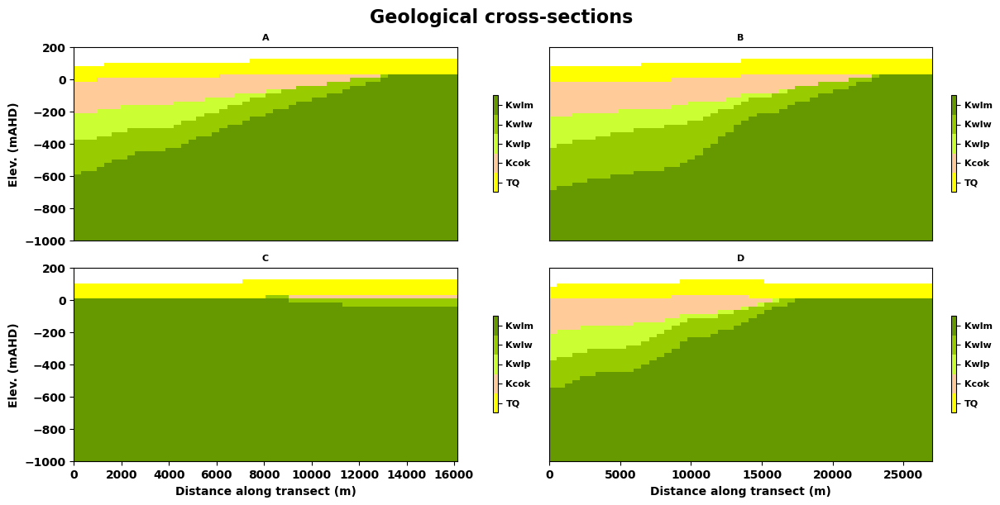

In [26]:
from preproc.truth import plot_xsections

z0 = -1000 # just for plotting. Make sure within bbox of structural model
z1 = 200   # just for plotting. Make sure within bbox of structural model
nh, nz = 50, 50 # plotting resolution
figsize = (12,6)

plot_xsections(
            structuralmodel,
            figsize = figsize,
            title = 'Geological cross-sections',
            #xlim = [spatial.x0, spatial.x1],
            #ylim = [spatial.y0, spatial.y1],
            dz = dz,
            xsections = spatial.xsections,
            xsection_names = spatial.xsection_names,
            z0 = z0, z1 = z1,
            nh = nh, nz = nz)

### 4. Meshing

In [27]:
# Create mesh object
from loopflopy.mesh import Mesh
special_cells = {
                 'chd': ['east', 'west'], 
                 'wel': ['pumpbores'], 
                 'obs': ['obsbores'],
                 'poly': ['lake'], 
                 }
mesh = Mesh(plangrid = 'tri', special_cells = special_cells) # special cells to identify as arguements 

In [32]:
from preproc.mesh import define_mesh
define_mesh(mesh, modelmaxtri = 100000)

In [33]:
mesh.create_bore_refinement(spatial)

node_list = ['bore_refinement_nodes','lake_nodes']#fault_nodes', 'bore_refinement_nodes',]
polygon_list = ['model_boundary_poly', 'inner_boundary_poly']
mesh.prepare_nodes_and_polygons(spatial, node_list, polygon_list)
mesh.create_mesh(project, spatial)

print('number of cells in plan = ', mesh.ncpl)

Creating bore refinement nodes for pumping bores
bore_refinement_nodes
lake_nodes
Creating triangular grid
number of cells in plan =  6575


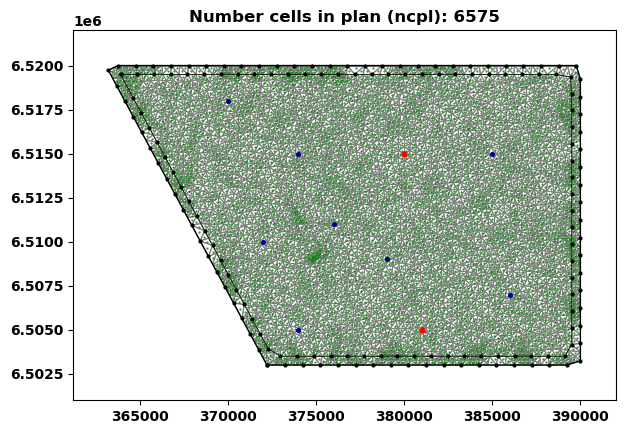

In [34]:
xlim = [spatial.x0 - 2000, spatial.x1 + 2000]
ylim = [spatial.y0 - 2000, spatial.y1 + 2000]

features = ['wel', 'obs', 'lake']
mesh.plot_cell2d(spatial, features, xlim = xlim, ylim = ylim)

### 5. Find Cell IDs of spatial features

Group =  chd ['east', 'west']
flag = 1
chd_east_cells [271 267 790 1195 272 791 277 792 300 2451 2398 299 2443 2442 2438 279
 2416 2433 2428 2420 2421 2422 2423 2445 2453 2432 2452 2457 2458 2471
 2459 2464 6502 6499 2470 284 293 6491 6486 6479 6487 6472 292 6255 294
 6285 6292 297 6288 6270 406 6263 6268 6274 6264 366 4949 4931 4916 4941
 369 4923 4917 4925 4927 4926 4920 4940 4935 4930 4928 4937 4944 4945 361
 2575 2582 362 375 2578 2569 2565 2567 2566 372 2560 2559 2544 2541 2554
 390 391 2542 2537 1850 2548 392 2536 2547 2590 397 1835]
chd_west_cells [10 4528 4529 4527 4526 4525 4522 3287 4517 4539 2 0 4542 4546 4516 3275 3
 4550 5 4 7 718 713 699 710 714 717 32 695 698 694 707 35 702 43 722 24
 719 744 22 25 1103 27 26 3083 6026 6028 6029 161 6021 6020 6015 110 6011
 6016 6002 6001 6006 5995 5297 3403 3402 3398 3392 3400 3399 3387 3383
 3386 750 102 3395 100 747 103 746 105 1541 1534 104 1537 1531 1535 1530
 1172 1155 107 1157 755 1149 1154 1146 1148 1143 1137 758 129 1162 128
 11

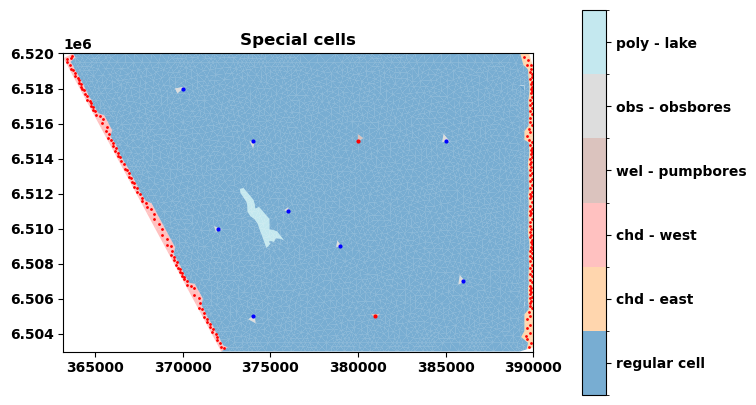

In [35]:
# Locate special cells and plot
mesh.locate_special_cells(spatial)

xlim = [355000, 370000]
ylim = [6525000, 6535000]

mesh.plot_feature_cells(spatial, xlim = None, ylim = None)

### 5. DEM

EPSG:28350
EPSG:28350


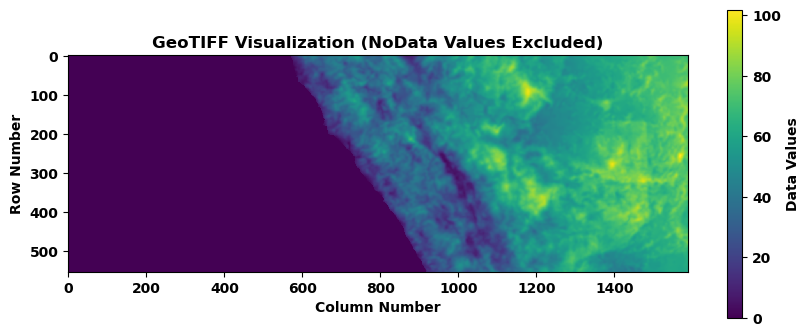

None
EPSG:28350


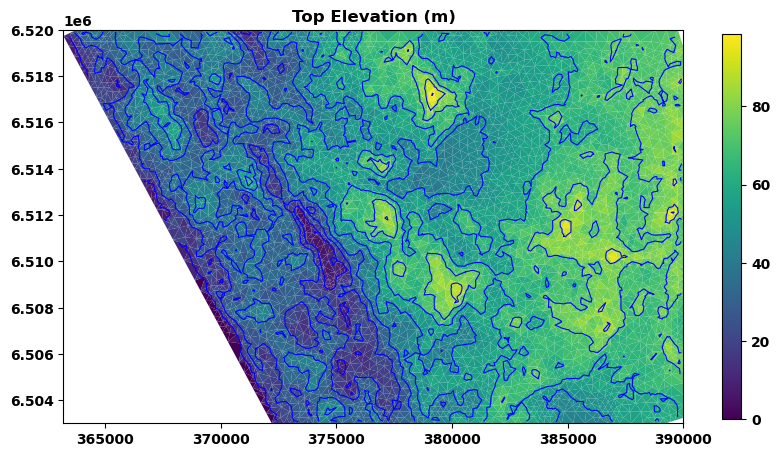

In [36]:
# Crops structuralmodel DEM to geomodel bounding box
dem = DEM(geotiff_fname = '../data/dem/cropped_raster.tif')
dem.crop_raster(bbox_path =  "../data/shp/model_boundary.shp", 
                cropped_raster_path = "../data/dem/geomodel_raster.tif")
dem.plot_geotiff()

#resample DEM to mesh
dem.resample_topo(mesh, 
                  output_fname = '../modelfiles/geomodel_topo.pkl', 
                  method="nearest", 
                  extrapolate_edges= True,) # only need to run when mesh changes. Take 1-2 minutes
dem.load_topo(fname = '../modelfiles/geomodel_topo.pkl')
dem.plot_topo(mesh, levels = np.linspace(0, 110, 10))

### 6. Geomodel

In [37]:
# Set up Geomodel (lithological block model of cells)
scenario = 'example'
vertgrid = 'con'    # {voxel: nlay, z0, z1} {con:   nls, res} {con2:  nls, res, max_thick}
z0, z1 = -1000, 200 

from loopflopy.geomodel import Geomodel # geomodel - pillar method + flat model bottom, geomodel2 - surface method and option to model x number of geolayers
geomodel = Geomodel(scenario, mesh, structuralmodel, vertgrid, z0, z1, nlg = 5) # surfaces calculated at a 3m resolution

In [38]:
# Create geomodel surfaces
geomodel.evaluate_structuralmodel(mesh, structuralmodel, res = 5)

Creating Geomodel for  example  ...

0. Creating xyz array... 
resolution for evaluating structural model =  5
z0 z1 self.res = -1000 200 5
   Time taken Block 0 (creating xyz array) =  2.52657

1. Evaluating structural model... -----
   len(xyz) =  1578000
   Time taken Block 1 (Evaluate model) =  33.013111


In [39]:
geomodel.create_model_layers(surface = dem.topo, nls = 2) # max_thick = 50, 


2. Creating geo model layers...
   nlay =  240
   ncpl =  6575
   nlg number of geo layers =  5
   botm_geo_shape (5, 6575)
   Time taken Block 2 (Create geological model layers) 0.404804

3. Creating flow model layers...
   Time taken Block 3 create flow model layers =  0.043449

4. Calculating cellids and gradients...
   Time taken Block 4 gradients=  2.598575


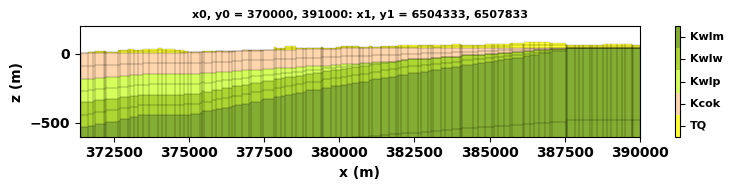

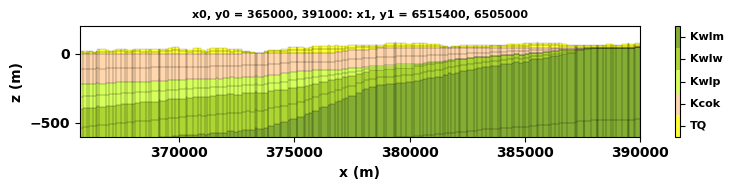

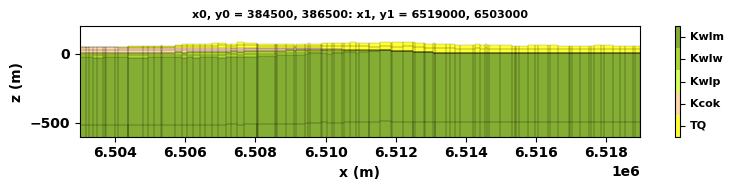

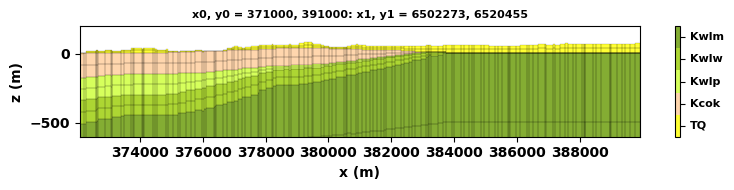

In [41]:
for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    geomodel.geomodel_transect_lith(figsize = (8,2), plot_node = None, z0 = -600, y0=y0, y1 = y1, x0=x0, x1=x1,)

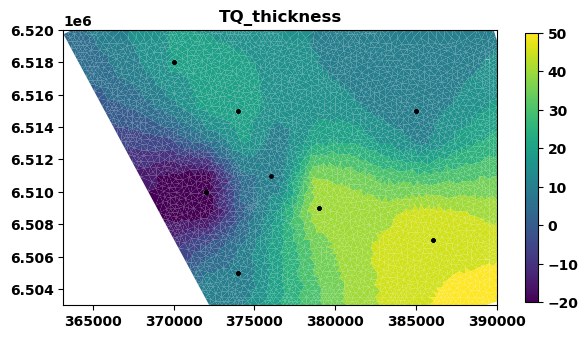

In [75]:
array = geomodel.botm_geo[0] # Top geo layer
title = 'TQ_thickness'
xy = [structuralmodel.data.X, structuralmodel.data.Y]
mesh.plot_array(array, title = title, levels = None, xy = xy)

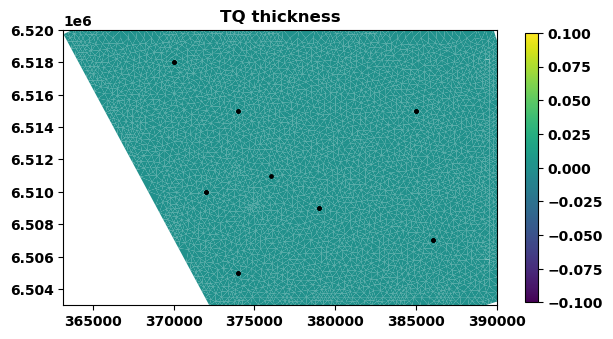

In [76]:
array = geomodel.botm_geo[1] - geomodel.botm_geo[0]# Top geo layer
title = 'TQ thickness'
xy = [structuralmodel.data.X, structuralmodel.data.Y]
a = np.where((array > 0.), True, False)
mesh.plot_array(a, title = title, levels = None, xy = xy)

In [77]:
geomodel.ang2.shape

(10, 6575)

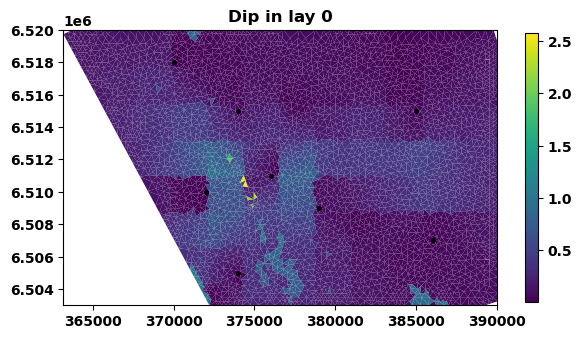

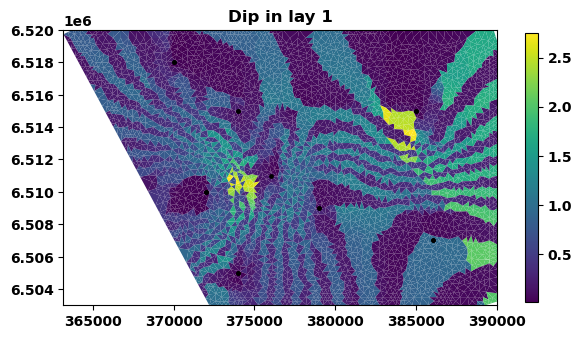

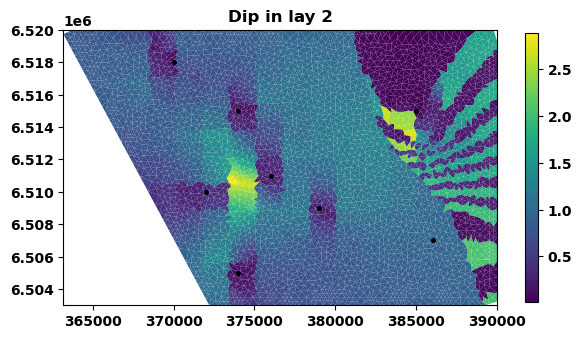

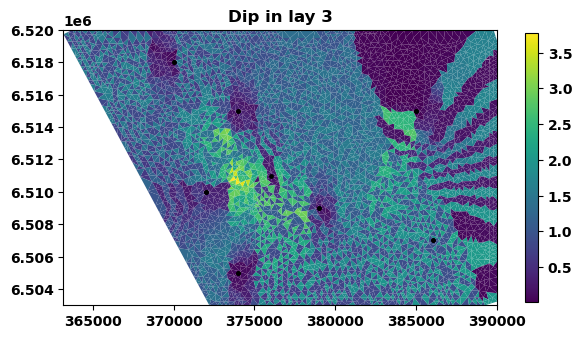

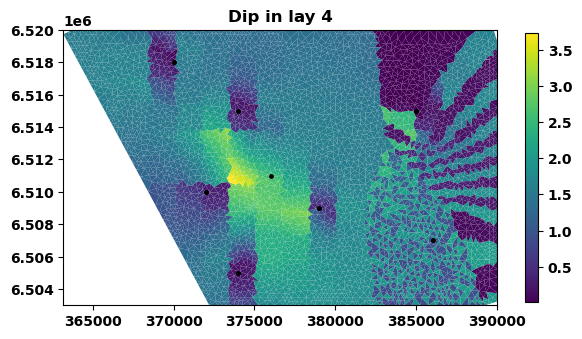

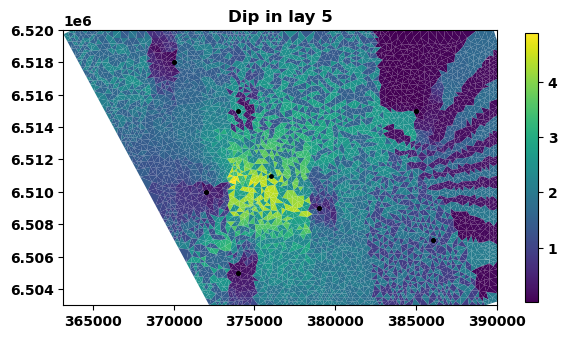

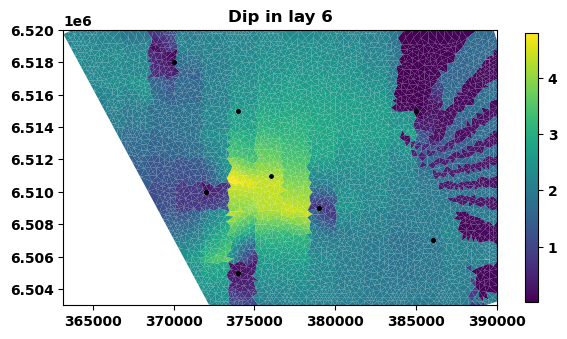

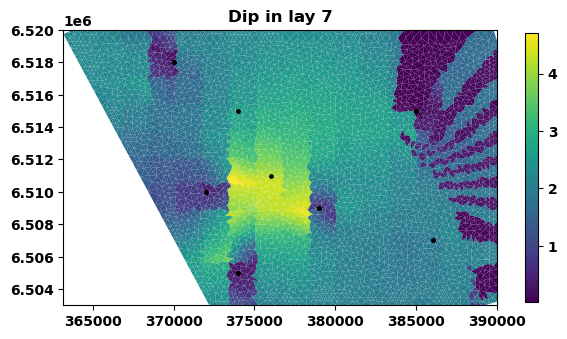

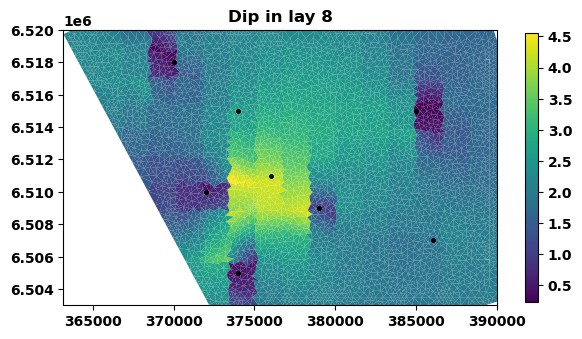

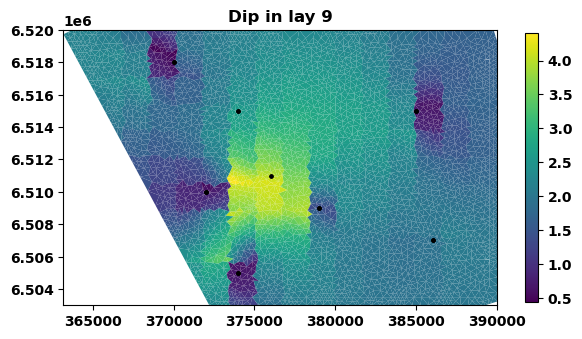

In [78]:
for i in range (10):
    array = geomodel.ang2[i] 
    xy = [structuralmodel.data.X, structuralmodel.data.Y]
    mesh.plot_array(array, title = f'Dip in lay {i}', levels = None, xy = xy)

### 6. Create synthetic heterogenous field

In [79]:
# Evaluate scalar field at mesh cell centroids
from preproc.structural import evaluate_geomodel_scalarfield
scalarfield = evaluate_geomodel_scalarfield(structuralmodel, geomodel)

k, feat =  0 TQ
TQ [5]
k, feat =  1 Kcok
Kcok [-174]
k, feat =  2 Leed1
Leed1 [-184]
k, feat =  3 Leed2
Leed2 [-739, -569]
k, feat =  4 Leed2
Leed2 [-739, -569]


#### Method 1: Kriging between random points/values

In [80]:
'''from preproc.truth import make_random_points, plot_random_points
make_random_points(spatial, num_points=100, fname = '../data/random_points.xlsx') # only need to do once
plot_random_points(spatial)'''

'''from preproc.truth import Truth1

truth1 = Truth1()
points_df = pd.read_excel('../data/random_points.xlsx')
gdf = truth1.make_randomfield_3d(geomodel, mesh, spatial, scalarfield, points_df, units = geomodel.units)
gdf'''

"from preproc.truth import Truth1\n\ntruth1 = Truth1()\npoints_df = pd.read_excel('../data/random_points.xlsx')\ngdf = truth1.make_randomfield_3d(geomodel, mesh, spatial, scalarfield, points_df, units = geomodel.units)\ngdf"

In [81]:
'''# Makes a random stochastic field for all the units with a mean of 0 and variance of 1. Take up to 5min.
anisotropy = (1., 0.5, 0.1)
corr_length = 5000
nugget = 0.05
n_neighbors = 10
rebuild_threshold = 0.1
truth1.field = truth1.stochasticfieldgeneration(gdf, geomodel, mesh, anisotropy, corr_length, nugget, n_neighbors, rebuild_threshold, scalarfield)

a = truth1.field[0] - truth1.field[1]
plt.hist(a)

from preproc.truth import plot_fields

plot_fields(geomodel, mesh, field=truth1.field, title="Method 1", levels=[-1, -0.5, 0, 0.5, 1], 
            vmin = -1, vmax = 1, xy=(points_df.x.values, points_df.y.values))'''

'# Makes a random stochastic field for all the units with a mean of 0 and variance of 1. Take up to 5min.\nanisotropy = (1., 0.5, 0.1)\ncorr_length = 5000\nnugget = 0.05\nn_neighbors = 10\nrebuild_threshold = 0.1\ntruth1.field = truth1.stochasticfieldgeneration(gdf, geomodel, mesh, anisotropy, corr_length, nugget, n_neighbors, rebuild_threshold, scalarfield)\n\na = truth1.field[0] - truth1.field[1]\nplt.hist(a)\n\nfrom preproc.truth import plot_fields\n\nplot_fields(geomodel, mesh, field=truth1.field, title="Method 1", levels=[-1, -0.5, 0, 0.5, 1], \n            vmin = -1, vmax = 1, xy=(points_df.x.values, points_df.y.values))'

In [82]:
'''for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    geomodel.geomodel_transect_lith(plot_node = None, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))
    geomodel.geomodel_transect_array(truth1.field, title = 'Method 1', grid = True, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))   '''

"for i in range(len(spatial.xsections)):\n    x0, y0 = spatial.xsections[i][0]\n    x1, y1 = spatial.xsections[i][1]\n    geomodel.geomodel_transect_lith(plot_node = None, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))\n    geomodel.geomodel_transect_array(truth1.field, title = 'Method 1', grid = True, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))   "

#### Method 2: Stochastic Field from random points

In [83]:
# Random field based on random points
# Makes a random stochastic field for all the units with a mean of 0 and variance of 1. Take up to 5min.
from preproc.truth import Truth2
truth2 = Truth2()

anisotropy = (1., 1., 0.1)
corr_length = 5000
nugget = 0.05
rebuild_threshold = 0.1
n_neighbours = 4
n_initial_points = 10
truth2.field = truth2.stochasticfieldgeneration(geomodel, mesh, anisotropy, corr_length, nugget, n_neighbours, n_initial_points, rebuild_threshold, scalarfield)

######  TQ #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13150, 4)
prop_values  (13150,)
prop_values  (2, 6575)
######  Kcok #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13150, 4)
prop_values  (13150,)
prop_values  (2, 6575)
######  Kwlp #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13150, 4)
prop_values  (13150,)
prop_values  (2, 6575)
######  Kwlw #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13150, 4)
prop_values  (13150,)
prop_values  (2, 6575)
######  Kwlm #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13150, 4)
prop_values  (13150,)
prop_values  (2, 6575)


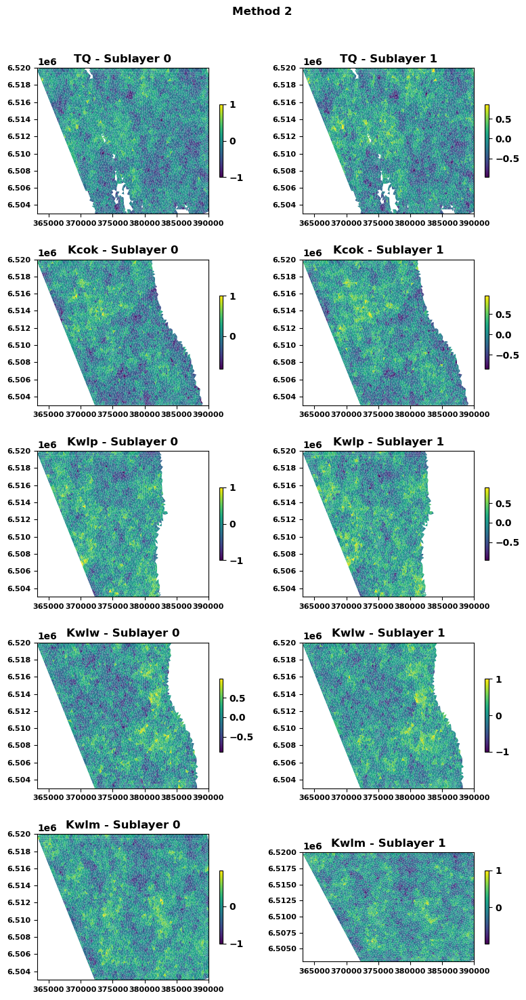

In [93]:
from preproc.truth import plot_fields
plot_fields(geomodel, mesh, field=truth2.field, 
            title="Method 2", 
            levels=[-1, -0.5, 0, 0.5, 1], 
            #vmin = -1, vmax = 1, 
            #xy=(points_df.x.values, points_df.y.values)
            )

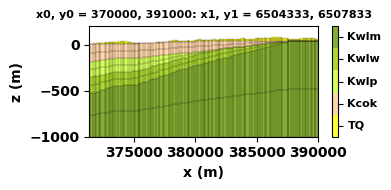

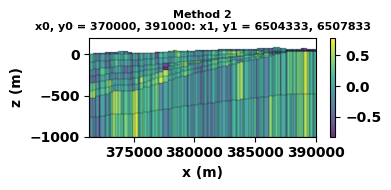

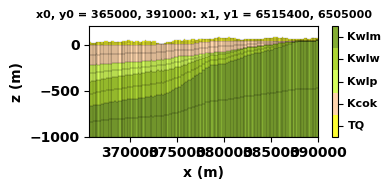

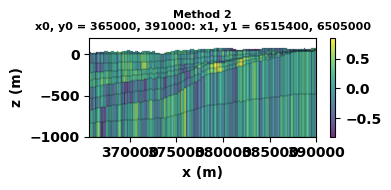

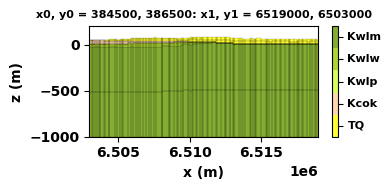

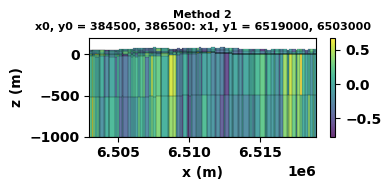

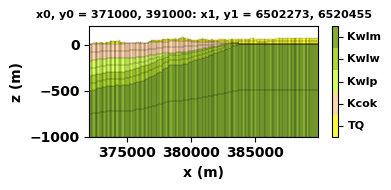

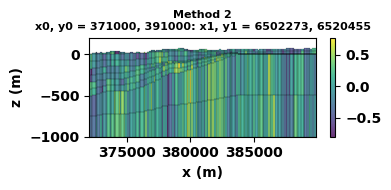

In [94]:
for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    geomodel.geomodel_transect_lith(plot_node = None, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))
    geomodel.geomodel_transect_array(truth2.field, title = 'Method 2', grid = True, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))   

In [95]:
prop_df = pd.read_excel('../data/truth_properties.xlsx', sheet_name = 'truth')
prop_df


,unit,kh_mean,kv_mean,sy_mean,ss_mean,kh_logstd,kv_logstd,sy_logstd,ss_logstd
0,TQ,5.0000,0.40000,0.3,5.000000e-06,0.40,1.2,0.1,0.9
1,Kcok,0.0001,0.00001,0.2,1.000000e-04,0.06,0.2,0.1,0.4
2,Kwlp,3.0000,0.03000,0.2,1.000000e-04,0.20,0.7,0.1,0.8
3,Kwlw,15.0000,0.00200,0.2,1.000000e-06,0.50,1.5,0.1,1.1
4,Kwlm,6.6000,0.00050,0.2,9.900000e-07,0.10,0.3,0.1,0.6


In [96]:
truth2.make_prop_fields(geomodel, prop_df)

#prop_disv = prop_layicpl_ma.flatten() # includes mask
#prop_disu = prop_layicpl_ma.compressed() # doesnt include mask


######  TQ #########

Unit 0: TQ
Unit 0: TQ

######  Kcok #########

Unit 1: Kcok
Unit 1: Kcok

######  Kwlp #########

Unit 2: Kwlp
Unit 2: Kwlp

######  Kwlw #########

Unit 3: Kwlw
Unit 3: Kwlw

######  Kwlm #########

Unit 4: Kwlm
Unit 4: Kwlm


In [97]:
truth2.print_prop_stats()


### Property statistics ###

Property         Mean          Min          Max      LogMean       LogMin       LogMax
--------------------------------------------------------------------------------------
kh         6.1743e+00   8.8947e-05   4.7434e+01  -7.8336e-02  -4.0509e+00   1.6761e+00
kv         9.4855e-02   6.7678e-06   6.3396e+00  -2.5648e+00  -5.1696e+00   8.0206e-01
ss         3.8899e-05   7.9433e-08   6.3096e-04  -5.1790e+00  -7.1000e+00  -3.2000e+00
sy         2.2215e-01   1.5887e-01   3.7768e-01  -6.6007e-01  -7.9897e-01  -4.2288e-01


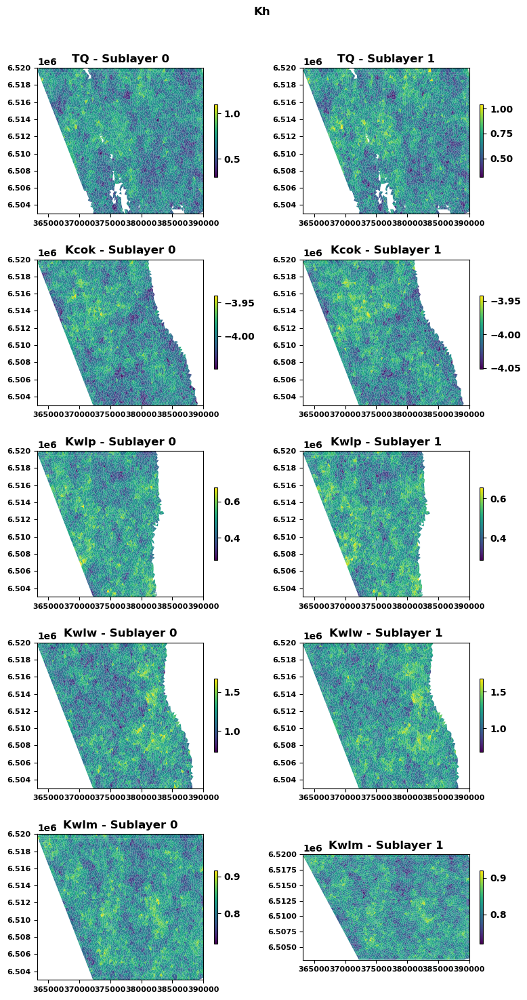

In [98]:
plot_fields(geomodel, mesh, field=np.log10(truth2.kh), title="Kh", 
            #vmin = -3, vmax = 2, 
            # #levels=[-1, -0.5, 0, 0.5, 1],  
            #xy=(points_df.x.values, points_df.y.values)
            )

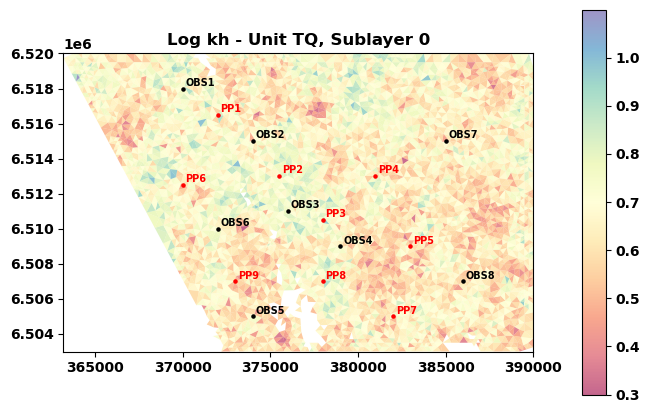

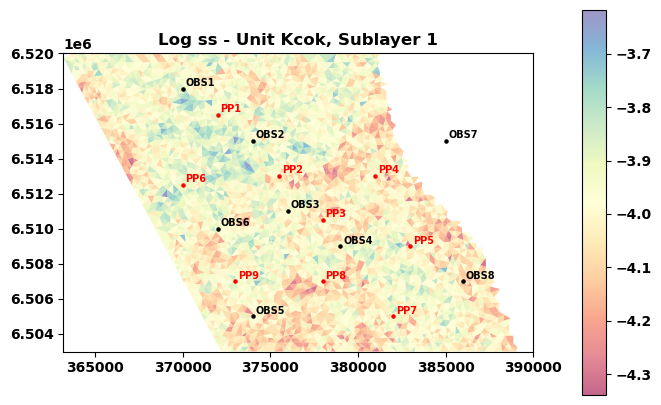

In [99]:
from preproc.truth import plot_propfield
unit, sublay, property = 'TQ', 0, 'kh'
plot_propfield(truth2, mesh, geomodel, spatial, unit, sublay, property, xlim = None, ylim = None)

unit, sublay, property = 'Kcok', 1, 'ss'
plot_propfield(truth2, mesh, geomodel, spatial, unit, sublay, property, xlim = None, ylim = None)

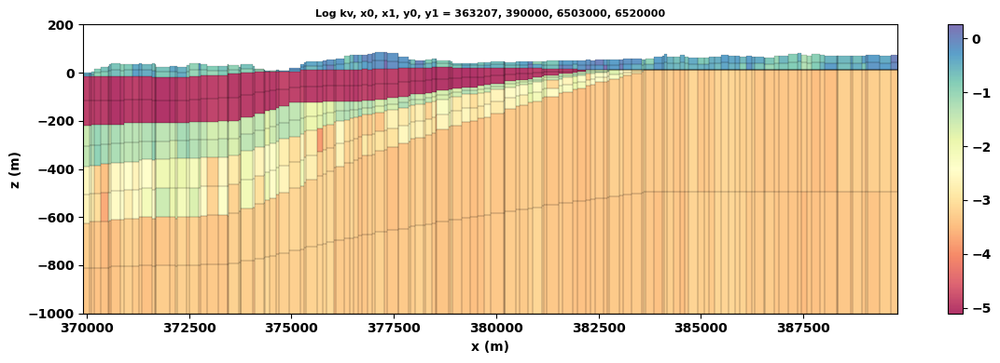

In [100]:
#spatial.xsections = [[(355000, 6530000),(400000, 6540000)], [(365000, 6510000),(400000, 6525000)]]
x0, x1, y0, y1 = spatial.xsections[0][0][0], spatial.xsections[0][1][0], spatial.xsections[0][0][1], spatial.xsections[0][1][1]
property = 'kv'
from preproc.truth import plot_propfield_usg
plot_propfield_usg(truth2,geomodel, spatial, property, x0, x1, y0, y1)

In [101]:
props = pd.read_excel(structuralmodel.geodata_fname, sheet_name = 'properties')
geomodel.iconvert_perlay = props.iconvert.tolist()

geomodel.fill_cell_properties_heterogeneous(truth)

ValueError: Worksheet named 'properties' not found

### 6. Prepare Data for Flowmodel

In [ ]:
from process_data import Data
data = Data()

data.process_ic()#geomodel)
data.process_rch(geomodel, mesh)
data.process_chd(spatial, geomodel, mesh)

wel_q = [-100000, 0]
wel_qlay= [0, 0]
data.process_wel(geomodel, mesh, spatial, wel_q, wel_qlay)

Well screens  [(np.float64(-1000.0), np.float64(-1.0)), (np.float64(-1000.0), np.float64(2.0))]


#### Process Observations

In [ ]:
df = pd.read_excel('../data/example_data.xlsx', sheet_name = 'obs_bores')
import process_observations
gdf = process_observations.make_obs_gdf(df, geomodel, mesh, spatial)

from loopflopy.observations import Observations
observations = Observations(gdf)
observations.make_recarray() # makes recarray for flowmodel

print(observations.gdf)

     id         x        y    z   kh                  geometry  cell_disv  \
0  OBS1  355120.0  6540562  -50    5    POINT (355120 6540562)      18196   
1  OBS2  364415.7  6534636 -100    1  POINT (364415.7 6534636)      22437   
2  OBS3  371000.0  6515000 -100   10    POINT (371000 6515000)      24688   
3  OBS4  385447.0  6537497 -500  100    POINT (385447 6537497)      57052   
4  OBS5  385200.0  6521000 -100    1    POINT (385200 6521000)      34486   
5  OBS6  372541.0  6525478 -100    3    POINT (372541 6525478)      25832   
6  OBS7  367502.0  6523500  -50   10    POINT (367502 6523500)      13855   

   cell_disu  (lay,icpl)  lay  icpl                               obscell_xy  \
0      17149   (3, 4396)    3  4396  (355330.98438145826, 6540327.512844525)   
1      20364   (4, 4037)    4  4037  (364261.74735699437, 6534934.394501741)   
2      21895   (5, 1688)    5  1688   (371047.0029852411, 6515430.307171156)   
3      53905  (12, 1852)   12  1852   (385496.5384433281, 65373

### 8. Create and run steady-state flow model

In [ ]:
from loopflopy.flowmodel import Flowmodel
project.mfexe_name = '../exe/mf6.exe'
scenario = 'steadymodel'

fm = Flowmodel(scenario, project, data, observations, mesh, geomodel)
# Write and run flow model files
sim = fm.write_flowmodel(chd = True, wel = True, obs = True, rch = True)
fm.run_flowmodel(sim)

   Writing simulation and gwf for  steadymodel  ...
xt3d =  True
   Time taken to write flow model =  20.016196
Running simulation for  steadymodel  ...
Model success =  True
   run_time =  11.679035
['DISU', 'NPF', 'IC', 'CHD_0', 'RCH_0', 'OBS_0', 'OC']
head results shape  (1, 65853)


In [ ]:
utils.print_object_details(fm)

Methods:
get_watertable
plot_plan
plot_transect
plot_watertable
run_flowmodel
write_flowmodel

Variables
chd
chdflow
data
geomodel
gwf
head
lith
logk11
logk33
mesh
newtonoptions
obs
obsdata
observations
project
rch
runtime
scenario
spd
staggered
wel
xt3d


In [ ]:
# IF A PROBLEM NODE FROM MFSIM, CAN LOT LOCATION HERE!
#utils.plot_node(1508-1, geomodel, structuralmodel, spatial, sim, scenario, z1 = 500, features = ['fault'])

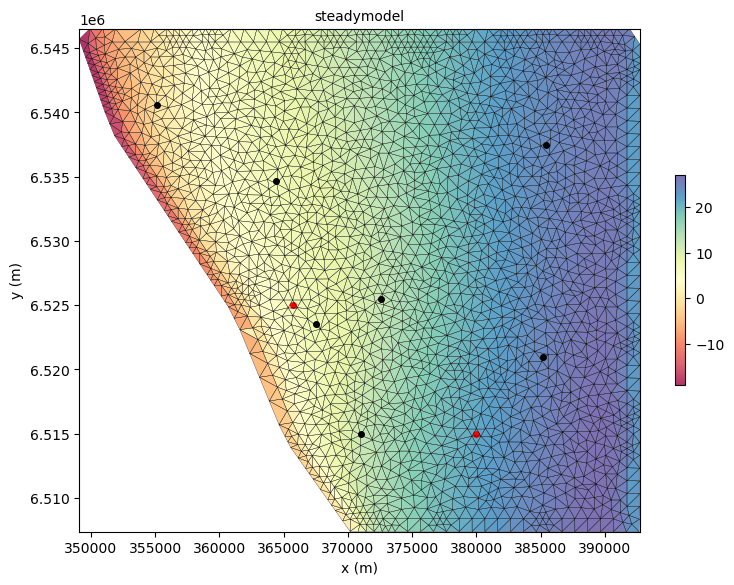

In [ ]:
watertable = fm.get_watertable(geomodel, fm.head)
fm.plot_watertable(spatial, mesh, geomodel, fm, watertable,)#, extent, vmin, vmax

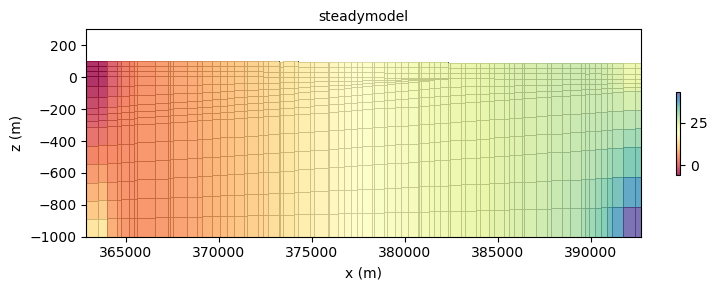

In [ ]:
fm.plot_transect(spatial, structuralmodel, 'head',  y0 = 6520000, y1 = 6520000, z1 = 300)#, X0, X1, Y0, Y1)

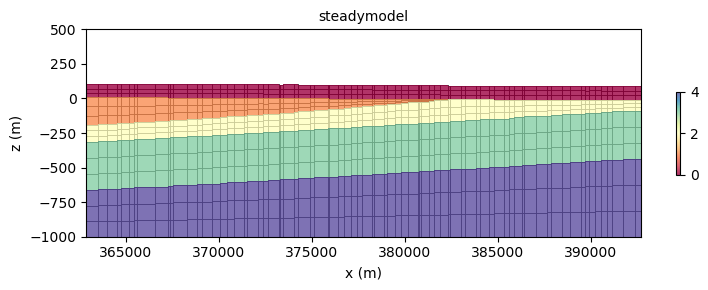

In [ ]:
fm.plot_transect(spatial, structuralmodel, 'lith', y0 = 6520000, y1 = 6520000)

In [ ]:
obj = fm
methods = [func for func in dir(obj) if callable(getattr(obj, func)) and not func.startswith("__")]
print("Methods in the class:  ",methods)
attributes = [attr for attr in dir(obj) if not callable(getattr(obj, attr)) and not attr.startswith("__")]
print("\nAttributes in the class:  ", attributes)

#for attribute, value in flowmodel.data.__dict__.items(): print(attribute)

Methods in the class:   ['get_watertable', 'plot_plan', 'plot_transect', 'plot_watertable', 'run_flowmodel', 'write_flowmodel']

Attributes in the class:   ['chd', 'chdflow', 'data', 'geomodel', 'gwf', 'head', 'lith', 'logk11', 'logk33', 'mesh', 'newtonoptions', 'obs', 'obsdata', 'observations', 'project', 'rch', 'runtime', 'scenario', 'spd', 'staggered', 'wel', 'xt3d']


### Create a steady state "truth"

In [ ]:
# Get convert obs package to arrays of oberservation heads
heads_truth = fm.head

# Get times
csv_file = os.path.join('../results/ref_past.csv')
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_past = df.iloc[:,0]/365
csv_file = os.path.join(project.workspace, R.modelname + "_future.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_future = df.iloc[:,0]/365+2
times = list(times_past) + list(times_future)

# Pickle reference results
fname = P.results + 'times.pkl'
pickle.dump(times, open(os.path.join(fname),'wb'))
fname = '../results/ref_ss.pkl'
pickle.dump(R.ref_steady, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_past.pkl'
pickle.dump(R.ref_past, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_future.pkl'
pickle.dump(R.ref_future, open(os.path.join(fname),'wb'))


### 9. Create and run transient flow model

In [ ]:
scenario = 'transientmodel'
well_q = [-2000, -2000]
data.process_wel(geomodel, mesh, spatial, well_q, wel_qlay)
data.strt = fm.head
fm2 = Flowmodel(scenario, project, data, observations, mesh, geomodel)

perlen = 2 * 365 # length of period (days)
nts = 12         # number of time steps for this period
fm2.perioddata = [(perlen, nts, 1.1)] # perlen, nts, tsmult

Well screens  [(np.float64(-1000.0), np.float64(32.0)), (np.float64(-1000.0), np.float64(6.0))]


In [ ]:
sim = fm2.write_flowmodel(transient = True, chd = True, wel = True, obs = True, rch = True)

   Writing simulation and gwf for  transientmodel  ...
   Time taken to write flow model =  5.524102


In [ ]:
fm2.run_flowmodel(sim, transient = True)

Running simulation for  transientmodel  ...
Model success =  True
   run_time =  10.117995
['DISU', 'NPF', 'IC', 'STO', 'WEL_0', 'CHD_0', 'RCH_0', 'OBS_0', 'OC']
head results shape  (1, 13358)


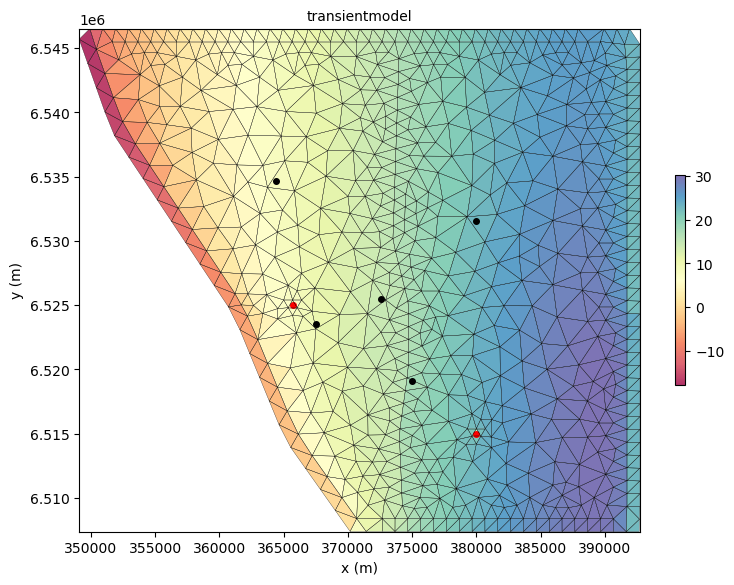

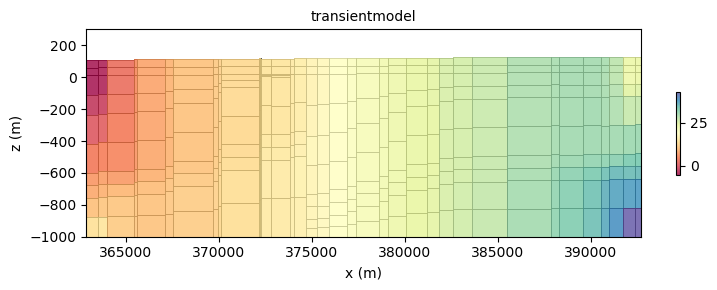

In [ ]:
watertable = fm2.get_watertable(geomodel, fm2.head)
fm2.plot_watertable(spatial, mesh, geomodel, fm2, watertable,)#, extent, vmin, vmax
fm2.plot_transect(spatial, structuralmodel, 'head',  y0 = 6520000, y1 = 6520000, z1 = 300)#, X0, X1, Y0, Y1)

#### Create "truth" observations and plot

In [ ]:
# Get convert obs package to arrays of oberservation heads
R.ref_steady  = functions.process_obs_steady(P, R)
R.ref_past    = functions.process_obs_past(P, R)
R.ref_future  = functions.process_obs_future(P, R)

# Get times
csv_file = os.path.join(P.workspace, R.modelname + "_past.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_past = df.iloc[:,0]/365
csv_file = os.path.join(P.workspace, R.modelname + "_future.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_future = df.iloc[:,0]/365+2
times = list(times_past) + list(times_future)

# Pickle reference results
fname = P.results + 'ref_ss.pkl'
pickle.dump(R.ref_steady, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_past.pkl'
pickle.dump(R.ref_past, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_future.pkl'
pickle.dump(R.ref_future, open(os.path.join(fname),'wb'))
fname = P.results + 'times.pkl'
pickle.dump(times, open(os.path.join(fname),'wb'))

In [ ]:
# PLOT REFERENCE OBSERVATIONS
import matplotlib.pyplot as plt
colors = ['red','green','blue']
R.ref_future.shape
for j in range(P.nobs):
    for i in range(P.nzobs):
        plt.plot(times_past, R.ref_past[j][i],'o', ms = 2, color = colors[i])
        plt.plot(times_future, R.ref_future[j][i],'o', ms = 2, color = colors[i])
plt.xlabel('Time (years)')
plt.ylabel('Head (m)')

In [ ]:
# CREATE SYNTHETIC OBSERVATIONS BY PERTURBING ACTUAL HEADS
err = 0.05
hobs_ref = np.copy(R.ref_past)    
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            hobs_ref[i][j][k] += np.random.normal(0.,err) # Perturb samples either side of measurement
plt.plot(R.ref_past.flatten(), 'o', ms = 1, label = 'actual heads')
plt.plot(hobs_ref.flatten(),'o', ms = 1, label = 'perturbed heads')
plt.xlabel('Observation index')
plt.ylabel('Head (m)')
plt.legend()

In [ ]:
%run ./figures.ipynb   
figure8(P, R)

#### Prepare PEST input arrays

In [ ]:
# PRINTING TRUTH HEADS FOR HISTORY MATCHING (PEST - HEADS.INS)
hobs_ref.shape #(5, 3, 12)
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            print('l1 [OBS%i_%i.%i]1:20' %(i, j, k))

In [ ]:
# PRINTING TRUTH HEADS FOR HISTORY MATCHING (PEST - CONTROL.PST)
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            print('OBS%i_%i.%i  %f  10.0  head' %(i, j, k, hobs_ref[i, j, k]))

#### Prepare parameter bounds

In [ ]:
# LOG
k_min = [0, -2, 0, -2, -1, -2.5, -0.5, -2.5, -5, -5, -5]
k_max = [1, -1, 1, -1, 0, -1.5, 0.5, -1.5, -4, -4, -4]
k_mean = [(k_max[i] - k_min[i])/2 + k_min[i] for i in range(len(k_min))]

print(k_min)
print(k_max)
print(k_mean)

In [ ]:
pickleoff = open('../results/reference.pkl','rb')
reference = pickle.load(pickleoff)
pickleoff.close()

# BLUE - MAX/MIN
# ORANGE - MEAN
# RED - ACTUAL
fig = plt.figure(figsize = (12,5))
plt.plot(np.linspace(0,10,11), k_min, 'o', color = 'blue')
plt.plot(np.linspace(0,10,11), k_max, 'o', color = 'blue')
plt.plot(np.linspace(0,10,11), k_mean, 'o', color = 'orange')
plt.plot(np.linspace(0,10,11), logfunc(reference[0] + reference[1] + reference[2][1:]), 'o', color = 'red')
plt.ylabel('Log')
plt.xticks(np.linspace(0,10,11), ['loghk0', 'loghk1', 'loghk2', 'loghk3', 
                                'logvk0', 'logvk1', 'logvk2', 'logvk3',
                                'logss1', 'logss2', 'logss2'])#, logss1, logss2, logss3, sy0, cp])
plt.show()

#### Pilot Point Setup

In [ ]:
properties = Properties() # set up a new properties object
df = pd.read_excel('../data/example_data.xlsx', sheet_name = 'pilot_points')
properties.make_gdf(geomodel, mesh, spatial, df)
#print(properties.gdf)

anisotropy = (1., 1., 0.0001)
CL = 5000.
nugget = 0.05
rebuild_threshold = 0.1

properties.kriging(geomodel, mesh, anisotropy, CL, nugget, rebuild_threshold)

#spatial.xsections = [[(355000, 6530000),(400000, 6540000)], [(365000, 6510000),(400000, 6525000)]]
x0, x1, y0, y1 = spatial.xsections[0][0][0], spatial.xsections[0][1][0], spatial.xsections[0][0][1], spatial.xsections[0][1][1]
properties.plot_propfield_usg(geomodel, spatial, x0, x1, y0, y1, property = 'kh')

'''# LOG
k_min = [0, -2, 0, -2]
k_max = [1, -1, 1, -1]
k_mean = [(k_max[i] - k_min[i])/2 + k_min[i] for i in range(len(k_min))]

print(k_min)
print(k_max)
print(k_mean)

Min.append(k_min[i+8]) 
Max.append(k_max[i+8])

# LAYER K
nr_param = 200 # Create lots of parameter sets
nr = 100 # How many successful flow models we want
import random 
logfunc = lambda e: np.log10(e)

def normal_sampling(mu, sigma, nr_param):
    nums = [] 
    count = 0
    while count < nr_param:
        temp = random.gauss(mu,sigma) 
        if temp >= mu - 3 * sigma and temp <= mu + 3*sigma:
            nums.append(temp)
            count += 1
    return(nums)

hk_mu = np.copy(hk) # from variables.ipynb
hk_mu_log = logfunc(hk_mu)
hk_sigma_log = [0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66]

vk_mu = np.copy(vk) # from variables.ipynb
vk_mu_log = logfunc(vk_mu)
vk_sigma_log = [0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66]

hk_parameters = []
vk_parameters = []

for n in range(8): # for each layer
    hk_parameters.append(normal_sampling(hk_mu_log[n], hk_sigma_log[n], nr_param))'''

#### History Matching

In [ ]:
def plot_scalarfield(self, transect_y, nx, nz, **kwargs):

        self.sequence_names = []
        for item in self.strat['sequence'].tolist():
            if item not in self.sequence_names:
                self.sequence_names.append(item)

        x0 = kwargs.get('x0', self.x0)
        z0 = kwargs.get('z0', self.z0)
        x1 = kwargs.get('x1', self.x1)
        z1 = kwargs.get('z1', self.z1)
        
        z = np.linspace(z0, z1, nz)
        x = np.linspace(x0, x1, nx)
        X,Z = np.meshgrid(x,z)

        labels = self.strat_names[1:]
        ticks = [i for i in np.arange(0,len(labels))]
        boundaries = np.arange(-1,len(labels),1)+0.5
        Y = np.zeros_like(X)
        Y[:,:] = transect_y[0]
        V = self.model.evaluate_model(np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
        
        for i, n in enumerate(transect_y):
            fig = plt.figure(figsize=(12, 3))
            ax = plt.subplot(len(transect_y), 1, i+1)
            

            val_above = 0
            # Evaluate scalar fields for each feature to plot contours
            for feat in self.sequence_names:
                print(feat)
                A = self.model.evaluate_feature_value(feat, np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
                print(A.shape)
                ax.imshow(np.ma.masked_where(V<0,A), origin = "lower", extent = [x0,x1,z0,z1])

            # Evaluate faults to plot
            #for fault in self.faults:
            #    F = self.model.evaluate_feature_value(fault, np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
            #    ax.contour(X, Z, F, levels = [0], colors = 'Black', linewidths=2., linestyles = 'dashed') 
            if i < (len(transect_y)-1):
                ax.set_xticks(ticks = [], labels = [])
            else:
                ax.set_xlabel('Northing (m)')

            #cbar.ax.set_yticks(ticks = ticks, labels = labels, size = 8, verticalalignment = 'center')    
            ax.set_title("y = " + str(transect_y[i]), size = 8)
            ax.set_ylabel('Elev. (mAHD)')
            ax.set_aspect('10') #0.5, 'equal'
            #plt.axis('equal')
            plt.savefig('../figures/structural_ytransects.png')
            plt.show()

plot_scalarfield(structuralmodel, transect_y, nx = 60, nz = 60, z0 = -200, )#z1 = 000) #x0 = 370000, x1 = 374000, 